### Context
- I am the owner of **Burger & Fries - Odeon** (link = 5d613f4b-ea6f-4ba9-8134-b8a93376cdca)
- I want to make offers to increase my visibility
- My main competitors are :
        <br>    **Blend - Odeon** : ( link : "7842041b-d375-4d25-84a3-9c7e17e52595") 
        <br>    **BIOBURGER - Montparnasse** : ( link : "222d8c66-c008-4a9d-95bb-48c59b500beb") 
        <br>    **Factory & Co - Odeon** : ( link : "27651792-817e-4cc9-bcaf-ef6d953575f9") 
        <br>    **Burger King - Paris Soufflot** : ( link : "165ba8ff-d058-5e6f-95ee-b271cb58b570")

### Dataset

This is an extract of data scraped with our current robots on the Uber Eats platform.
The data is for the week of May 23, 2022 for 3 areas of Ile de France:
- paris/6th-luxembourg
- paris/6th-rennes
- paris/5th-saint-michel

For Luxembourg, for example, the homepage is visible [here](https://www.ubereats.com/fr/feed?diningMode=DELIVERY&pl=JTdCJTIyYWRkcmVzcyUyMiUzQSUyMkx1eGVtYm91cmclMjIlMkMlMjJyZWZlcmVuY2UlMjIlM0ElMjJDaElKaTVScmpOcHg1a2NSd3RTU21RV2JIaEUlMjIlMkMlMjJyZWZlcmVuY2VUeXBlJTIyJTNBJTIyZ29vZ2xlX3BsYWNlcyUyMiUyQyUyMmxhdGl0dWRlJTIyJTNBNDguODQ3NjM1JTJDJTIybG9uZ2l0dWRlJTIyJTNBMi4zNDA0MjQzJTdE)
You can see "carousels" like "Offers of the day".

You will find the data and their nomenclature on this link Google Drive : [GDrive](https://drive.google.com/drive/folders/1ljfP2NBt22eYPGVEcbXjs9ExXkY2onop)

### Task
Provide usem cases, data visualization etc... in the context of a restaurant owner (our customers!)
The objective is also to show creativity and analytical skills when faced with business data.

## Introduction

In [100]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import datetime as dt
import math
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

We will first import all the libraries necessary for our data analysis.

In [120]:
uber_eat = pd.read_csv('ubereats_data_23_05_2022_29_05_2022.csv')

shop = pd.read_csv('sample_ubereats_shop_for_test.csv')

uber_eat = pd.merge(uber_eat, shop, on='link', how='inner')

uber_eat.head()

,link,timestamp,page,pagetype,category,rank,counttotal,deliverytimemin,deliverytimemax,deliveryfee,offer,availability,year,month,day,name,url,longitude,latitude,text_address
0,163d620a-ff92-4b45-8eda-8336a592f0c8,2022-05-28 07:01:43,paris/6eme-rennes,homepage,other,14,87,30.0,40.0,3.49,Plus que 4 commandes pour gagner 6 €,True,2022,5,28,Season - Martyrs,/fr/store/season-martyrs/Fj1iCv-SS0WO2oM2pZLwyA,2.340422,48.880776,"30 Avenue Trudaine, Paris, IDF 75009"
1,163d620a-ff92-4b45-8eda-8336a592f0c8,2022-05-26 07:01:40,paris/6eme-rennes,homepage,other,9,100,25.0,35.0,3.49,Plus que 4 commandes pour gagner 6 €,True,2022,5,26,Season - Martyrs,/fr/store/season-martyrs/Fj1iCv-SS0WO2oM2pZLwyA,2.340422,48.880776,"30 Avenue Trudaine, Paris, IDF 75009"
2,163d620a-ff92-4b45-8eda-8336a592f0c8,2022-05-23 07:01:40,paris/6eme-rennes,homepage,other,25,151,30.0,40.0,3.49,Plus que 4 commandes pour gagner 6 €,True,2022,5,23,Season - Martyrs,/fr/store/season-martyrs/Fj1iCv-SS0WO2oM2pZLwyA,2.340422,48.880776,"30 Avenue Trudaine, Paris, IDF 75009"
3,163d620a-ff92-4b45-8eda-8336a592f0c8,2022-05-28 07:16:31,paris/6eme-luxembourg,homepage,other,11,90,25.0,35.0,3.49,Plus que 4 commandes pour gagner 6 €,True,2022,5,28,Season - Martyrs,/fr/store/season-martyrs/Fj1iCv-SS0WO2oM2pZLwyA,2.340422,48.880776,"30 Avenue Trudaine, Paris, IDF 75009"
4,163d620a-ff92-4b45-8eda-8336a592f0c8,2022-05-28 07:16:36,paris/6eme-rennes,homepage,other,13,91,25.0,35.0,3.49,Plus que 4 commandes pour gagner 6 €,True,2022,5,28,Season - Martyrs,/fr/store/season-martyrs/Fj1iCv-SS0WO2oM2pZLwyA,2.340422,48.880776,"30 Avenue Trudaine, Paris, IDF 75009"


We have the following data set:
- "link": "unique identifier of the shop",
- "timestamp": "date of the visit on the page",
- "page": "geographical area",
- "pagetype": "type of page (homepage == homepage of a district)",
- "category": "specific insert (Carousel) if not other",
- "rank": "ranking on the category",
- "counttotal": "number of shops visible in the category",
- "deliverytimemin": "minimum delivery time",
- "deliverytimemax": "max. delivery time",
- "deliveryfee": "delivery fee",
- "offer": "details of the offer if applicable",
- "availability": "the shop accepts orders",
- "year": "year",
- "month": "month",
- "day": "day"
- "longitude" : First coordinate of the restaurant
- "latitude":  Second coordinate of the restaurant
- "text address": Real address (city, postal code, street number, street name) of the restaurant in Paris

In [101]:
# Create additional columns
uber_eat['timestamp'] = pd.to_datetime(uber_eat['timestamp'])
uber_eat['has_offer'] = uber_eat['offer'].apply(lambda x: 'Yes' if isinstance(x, float) == False else 'No')
uber_eat['deliverytimemean'] = (uber_eat['deliverytimemin'] + uber_eat['deliverytimemax']) / 2
uber_eat["rank_percentage"] = (uber_eat["rank"] * 100) / uber_eat["counttotal"]

# Create the time categories
morning = (uber_eat['timestamp'].dt.hour >= 22) | (uber_eat['timestamp'].dt.hour < 12)
noon_to_two = (uber_eat['timestamp'].dt.hour >= 12) & (uber_eat['timestamp'].dt.hour < 14)
afternoon = (uber_eat['timestamp'].dt.hour >= 14) & (uber_eat['timestamp'].dt.hour < 18)
dinner = (uber_eat['timestamp'].dt.hour >= 18) & (uber_eat['timestamp'].dt.hour < 22)

# Assign the categories to the time column
uber_eat.loc[morning, 'time'] = 'morning'
uber_eat.loc[noon_to_two, 'time'] = 'noon_to_two'
uber_eat.loc[afternoon, 'time'] = 'afternoon'
uber_eat.loc[dinner, 'time'] = 'dinner'

# Display Data
uber_eat[['timestamp', 'time']].head()

,timestamp,time
0,2022-05-28 07:01:43,morning
1,2022-05-26 07:01:40,morning
2,2022-05-23 07:01:40,morning
3,2022-05-28 07:16:31,morning
4,2022-05-28 07:16:36,morning


We have added 4 columns:
- First, we converted the timestamp column to datetime format to be able to apply temporal filters 
- We have added a column that allows us to know if the restaurant was offering an offer at the time of the scrapping
- Average delivery time between the minimum and maximum delay
- the percentage of the top according to the category it is in 
- The time of day: morning between 10pm and 12pm, lunch between 12pm and 2pm, afternoon between 2pm and 6pm and dinner between 6pm and 10pm

In [88]:
uber_eat_filtered = uber_eat[uber_eat['link'].isin(['7842041b-d375-4d25-84a3-9c7e17e52595', '222d8c66-c008-4a9d-95bb-48c59b500beb',
                   '27651792-817e-4cc9-bcaf-ef6d953575f9', '165ba8ff-d058-5e6f-95ee-b271cb58b570', '5d613f4b-ea6f-4ba9-8134-b8a93376cdca'])]

We will filter on the restaurants that interest us : we as **Burger & Fries** (link = 5d613f4b-ea6f-4ba9-8134-b8a93376cdca) and our competitors :
- "Blend - Odeon" : ( link : "7842041b-d375-4d25-84a3-9c7e17e52595") 
- BIOBURGER - Montparnasse" : ( link : "222d8c66-c008-4a9d-95bb-48c59b500beb") 
- "Factory & Co - Odeon" : ( link : "27651792-817e-4cc9-bcaf-ef6d953575f9") 
- "Burger King - Paris Soufflot" : ( link : "165ba8ff-d058-5e6f-95ee-b271cb58b570")

## Average Rank by day period

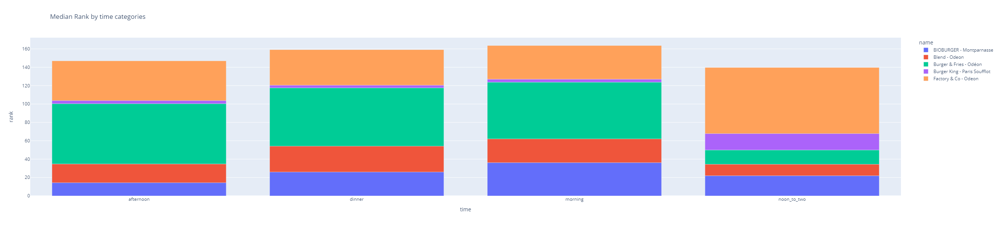

In [45]:
avg_rank_by_time_name = uber_eat_filtered.groupby(['time', 'name'])['rank'].mean().reset_index()
fig = px.bar(avg_rank_by_time_name, x='time', y='rank', color='name', title="Median Rank by time categories")

fig.update_layout(
    width=800,
    height=600
)


fig.show()

Between noon and two, restaurant Blend - Odeon has the best average ranking compared to its direct competitors. For the other periods (dinner, afternoon and night), Burking has the best average ranking from Uber Eat. For our restaurant Burger & Fries - Odeon, we only have a second place between noon and two, followed closely by Blend - Odeon and followed closely by Burger King.

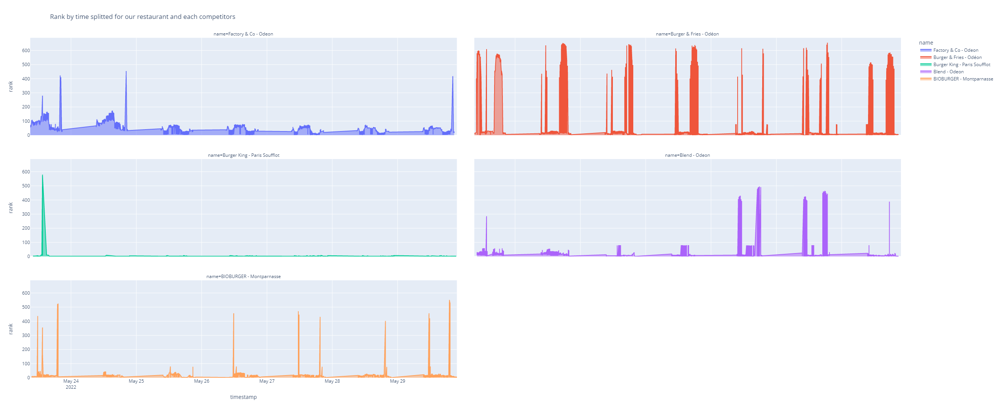

In [33]:
fig = px.area(uber_eat_filtered, x="timestamp", y="rank", facet_col="name", facet_col_wrap=2, color="name", title="Rank by time splitted for our restaurant and each competitors")

fig.update_layout(
    width=1920,
    height=1080
)


fig.show()

We can observe that there are many outliers. This is certainly due to a scrapping according to the categories. We will come back to this point later in the analysis. To have a global view of the ranking while avoiding taking outliers into account, we will take the median rank for each restaurant instead. This will allow us to interpret the global rank 50% of the time.

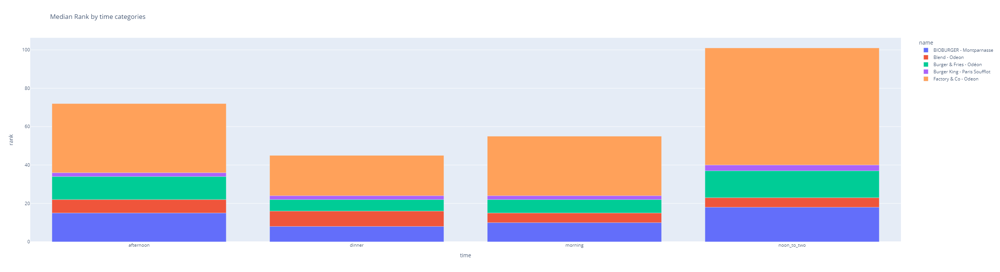

In [35]:
uber_eat_filtered = uber_eat[uber_eat['link'].isin(['7842041b-d375-4d25-84a3-9c7e17e52595', '222d8c66-c008-4a9d-95bb-48c59b500beb',
                   '27651792-817e-4cc9-bcaf-ef6d953575f9', '165ba8ff-d058-5e6f-95ee-b271cb58b570', '5d613f4b-ea6f-4ba9-8134-b8a93376cdca'])]

avg_rank_by_time_name = uber_eat_filtered.groupby(['time', 'name'])['rank'].median().reset_index()
fig = px.bar(avg_rank_by_time_name, x='time', y='rank', color='name', title="Median Rank by time categories")

fig.update_layout(
    width=1280,
    height=720
)


fig.show()

Among our main competitors and taking into account the median, we have the burger king restaurant which dominates by being 50% of the time in the top 3 (all categories combined). We must be able to see when we need to make offers to increase visibility. This will allow us to gain a few places in the rankings to better compete with Blend - Odeon which is a few places ahead of us.

## Opening Time

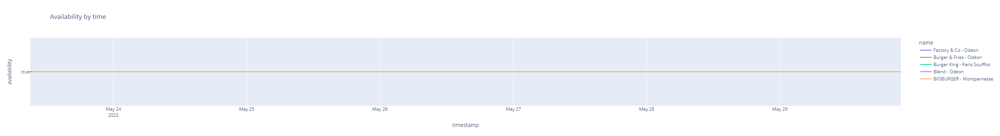

In [9]:
fig = px.line(uber_eat_filtered, x="timestamp", y="availability", color="name", title="Availability by time")
fig.show()

The column does not tell us when the restaurants are open or closed. So we have to find another way to determine if the restaurant has opening hours or if it is open 24/7

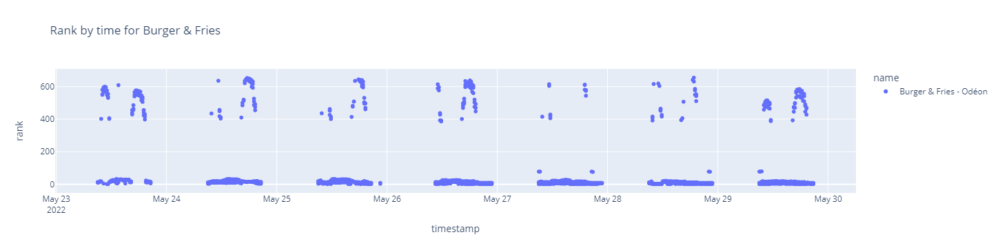

In [125]:
ub_ts = uber_eat_filtered[uber_eat_filtered['name'] == 'Burger & Fries - Odéon'].set_index('timestamp')
ub_ts.sort_index(ascending=True, inplace=True)
fig = px.scatter(ub_ts, x=ub_ts.index, y="rank", color='name', title = 'Rank by time for Burger & Fries')
fig.show()

Uber Eat works like this: if a restaurant is closed, then it is grayed out and appears in the bottom ranks (> 100). In our scrape, if our restaurant is closed, it does not appear in the dataset. So there will be a hole in our dataset without any additional information. The closing of the restaurant does not explain the ranks > 100 because it happens at regular opening hours (between noon and two for example)

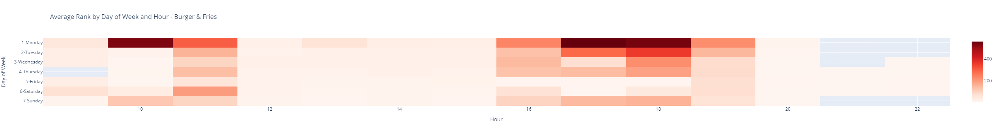

In [11]:
df_median_by_day_hour = uber_eat_filtered[uber_eat_filtered['name'] == 'Burger & Fries - Odéon'].groupby([uber_eat_filtered['timestamp'].dt.day_name(), uber_eat_filtered['timestamp'].dt.hour])["rank"].mean().round(1)

# add prefix to day names
df_median_by_day_hour.index = df_median_by_day_hour.index.set_levels(df_median_by_day_hour.index.levels[0].str.replace('Monday', '1-Monday').str.replace('Tuesday', '2-Tuesday').str.replace('Wednesday', '3-Wednesday').str.replace('Thursday', '4-Thursday').str.replace('Friday', '5-Friday').str.replace('Saturday', '6-Saturday').str.replace('Sunday', '7-Sunday'), level=0)

# create a heatmap
fig = go.Figure(data=go.Heatmap(
                   z=df_median_by_day_hour.values,
                   x=df_median_by_day_hour.index.get_level_values(1),
                   y=df_median_by_day_hour.index.get_level_values(0),
                   colorscale='reds'))

fig.update_layout(
    title='Average Rank by Day of Week and Hour - Burger & Fries',
    xaxis_title='Hour',
    yaxis_title='Day of Week',
    yaxis=dict(categoryorder='category descending')
)

fig.show()

For our restaurant, the darker the color, the higher the rank. According to Google, the opening hours are from 11am to midnight. In the morning the restaurant is rather badly ranked. This must be due to the opening hours of the restaurant. At lunch time as well as at dinner time, the rank is much more interesting for the restaurant. Finally, between 4pm and 7pm, the rank of our restaurant drops again. Our restaurant is open at this time and there is an opportunity to take at this level.

## Offer

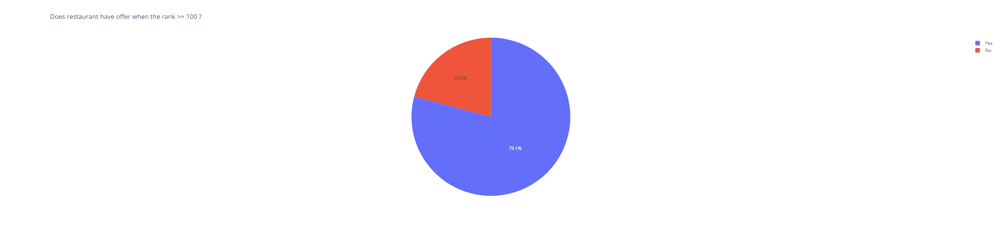

In [36]:
count_by_offer = uber_eat_filtered[uber_eat_filtered['rank'] >= 100].groupby('has_offer')['link'].count()
fig = px.pie(count_by_offer, values='link', names=count_by_offer.index, title='Does restaurant have offer when the rank >= 100 ?')

fig.update_layout(
    width=800,
    height=600
)


fig.show()

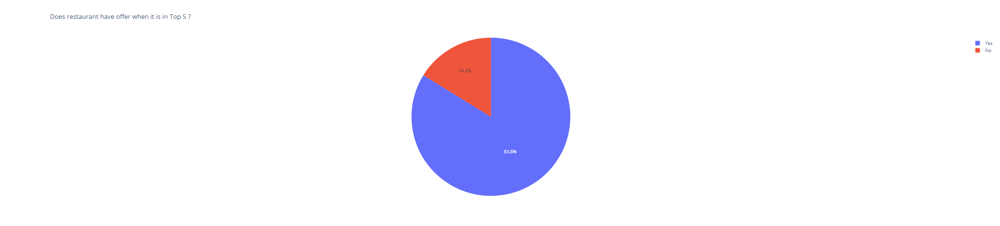

In [37]:
count_by_offer = uber_eat_filtered[uber_eat_filtered['rank'] <= 5].groupby('has_offer')['link'].count()
fig = px.pie(count_by_offer, values='link', names=count_by_offer.index, title='Does restaurant have offer when it is in Top 5 ?')

fig.update_layout(
    width=800,
    height=600
)


fig.show()

The lack of supply does not affect the restaurant's rank. The restaurants in the Top 5 have more offers with 4 points more than the restaurants with a rank above 100. But this does not justify the very high rank because the difference is not significant.

## Location

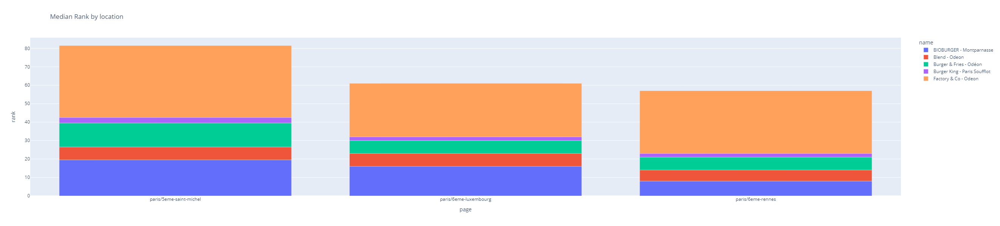

In [38]:
avg_rank_by_location = uber_eat_filtered.groupby(['page', 'name'])['rank'].median().reset_index()
fig = px.bar(avg_rank_by_location, x='page', y='rank', color='name', title="Median Rank by location")

fig.update_layout(
    width=800,
    height=600
)


fig.show()

All restaurants are much worse ranked in the 5th arrondissement of Paris. The 6th arrondissement seems to be the most likely area to come across our restaurant or its competitors.

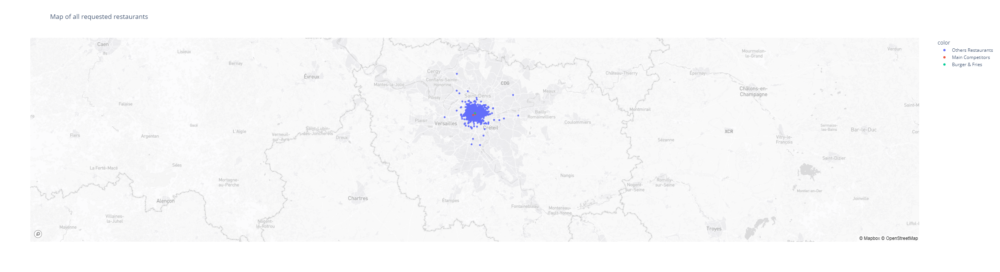

In [40]:
px.set_mapbox_access_token('pk.eyJ1IjoibWFyd2Fub3JpZ2luYWxzIiwiYSI6ImNsZzB6bzc0ajAweGMzZHIwNXVrODlrbmIifQ.fR3U1ehfHdRjsJ8Ci3F_3g')

shop['color'] = ['Main Competitors' if link in ['7842041b-d375-4d25-84a3-9c7e17e52595', '222d8c66-c008-4a9d-95bb-48c59b500beb',
                   '27651792-817e-4cc9-bcaf-ef6d953575f9', '165ba8ff-d058-5e6f-95ee-b271cb58b570'] else 'Burger & Fries' if link == '5d613f4b-ea6f-4ba9-8134-b8a93376cdca' else 'Others Restaurants' for link in shop['link']]

fig = px.scatter_mapbox(shop, lat='latitude', lon='longitude', hover_name='name', color="color", title="Map of all requested restaurants")
fig.update_layout(mapbox_style='mapbox://styles/mapbox/light-v11')

fig.update_layout(
    width=1280,
    height=720
)


# show map in a cell
fig.show()

There are a lot of restaurants that are requested during our scrapping. Most of them are in Paris. However, there are restaurants located 20km from Paris that are solocited by our research. The delivery time must be high enough for these restaurants to be poorly referenced. We can notice that our restaurant and its competitors are very close. The Bioburger as well as the Burger King are in margin of our restaurant and was separated by the garden of Luxembourg.

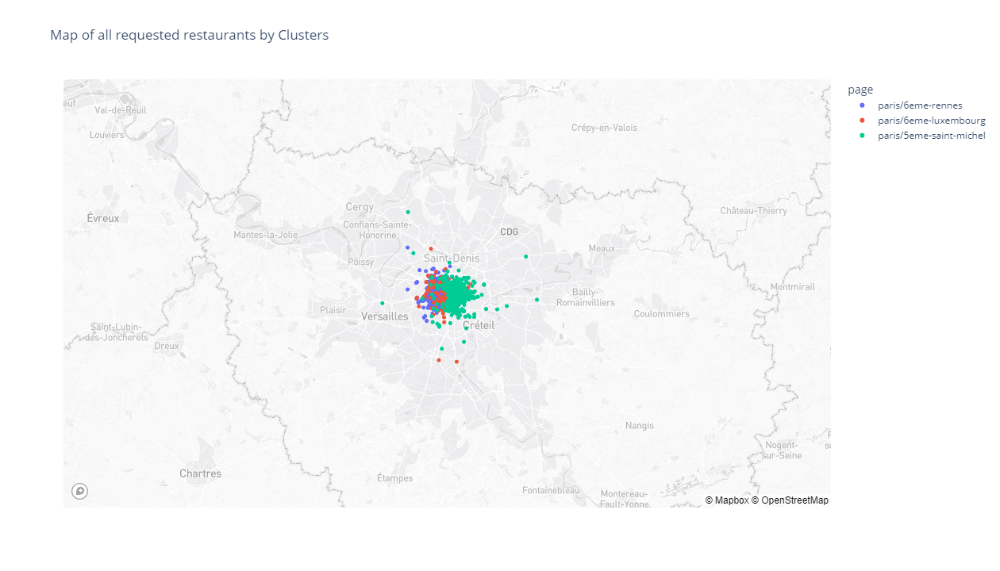

In [121]:
delivery_mean = uber_eat.groupby(['name', 'page'])['deliverytimemin'].mean().reset_index()

idx_min = delivery_mean.dropna(subset=['deliverytimemin']).groupby('name')['deliverytimemin'].idxmin()
min_categories = delivery_mean.loc[idx_min, ['name', 'page']]

shop = pd.merge(min_categories, shop, on='name', how='inner')

fig = px.scatter_mapbox(shop, lat='latitude', lon='longitude', hover_name='name', color="page", title="Map of all requested restaurants by Clusters")
fig.update_layout(mapbox_style='mapbox://styles/mapbox/light-v11')

fig.update_layout(
    width=1280,
    height=720
)

# show map in a cell
fig.show()

We constructed the clusters of different pages per restaurant based on the minimum delivery time. The 3 clusters are Paris Rennes in the West, Paris Luxembourg in the Middle dnd in the center of Paris and all Est, it is the Saint-Michel district which is the most efficient in terms of delivery time. 

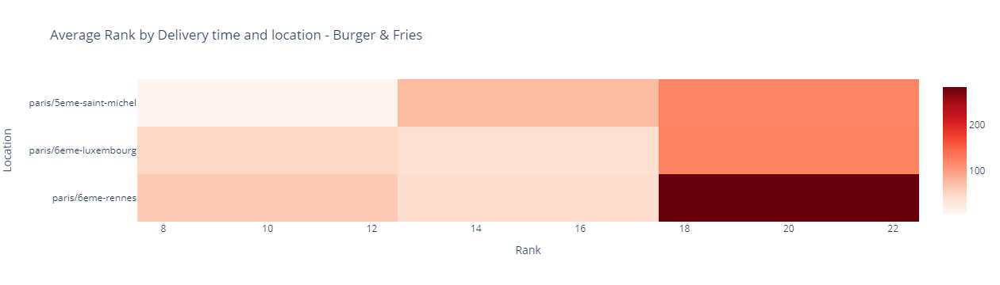

In [122]:
df_median_by_delivery_location = uber_eat_filtered[uber_eat_filtered['name'] == 'Burger & Fries - Odéon'].groupby([uber_eat_filtered['page'], uber_eat_filtered['deliverytimemean']])["rank"].mean().round(1)

# create a heatmap
fig = go.Figure(data=go.Heatmap(
                   z=df_median_by_delivery_location.values,
                   x=df_median_by_delivery_location.index.get_level_values(1),
                   y=df_median_by_delivery_location.index.get_level_values(0),
                   colorscale='reds'))

fig.update_layout(
    title='Average Rank by Delivery time and location - Burger & Fries',
    xaxis_title='Rank',
    yaxis_title='Location',
    yaxis=dict(categoryorder='category descending')
)

fig.show()

For our restaurant, on average it is the 6th district in Luxembourg that is the fastest in terms of delivery. As Burger & Fries is located in the center of Paris, it is between Saint-Michel and Luxembourg that the times are very interesting to be put forward by the platform. However, we are badly classified in Saint-Michel which should have a very interesting opportunity for us. We are rather well placed for the district of Rennes.

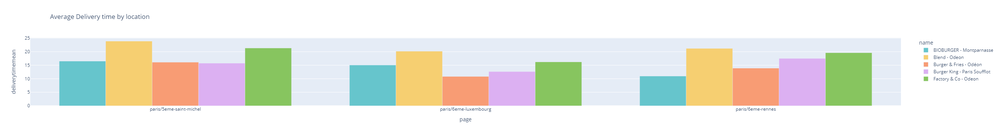

In [18]:
avg_delivery_time_by_location = uber_eat_filtered.groupby(['page', 'name'])['deliverytimemean'].mean().reset_index()
fig = px.bar(avg_delivery_time_by_location, x='page', y='deliverytimemean', color='name', title="Average Delivery time by location", barmode='group', color_discrete_sequence=px.colors.qualitative.Pastel)
fig.show()

We have the best delivery time in Luxembourg. We have to try to improve it in other areas to be better referenced. Blend Odeon has quite mediocre results in this exercise. This is an opportunity to move ahead. 

## Categories

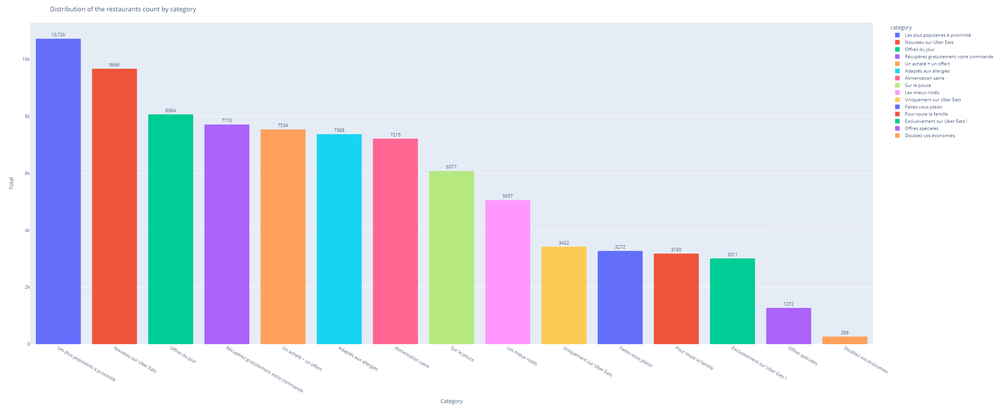

In [59]:
# Compute the frequency count of each category
category_counts = uber_eat[uber_eat.category != 'other'].value_counts('category')

# Sort categories by count
sorted_categories = category_counts.index.tolist()

fig = px.histogram(uber_eat[uber_eat.category != 'other'], x='category', color='category',
                   category_orders={"category": sorted_categories})

# Update layout
fig.update_layout(title='Distribution of the restaurants count by category',
                  xaxis_title='Category',
                  yaxis_title='Total')

fig.update_layout(
    width=1920,
    height=1080
)


fig.update_traces(texttemplate='%{y}', textposition='outside')

fig.show()

There are several offers listed on Uber Eats. We removed the Other category because it took up too much space in our chart which focused on offers.

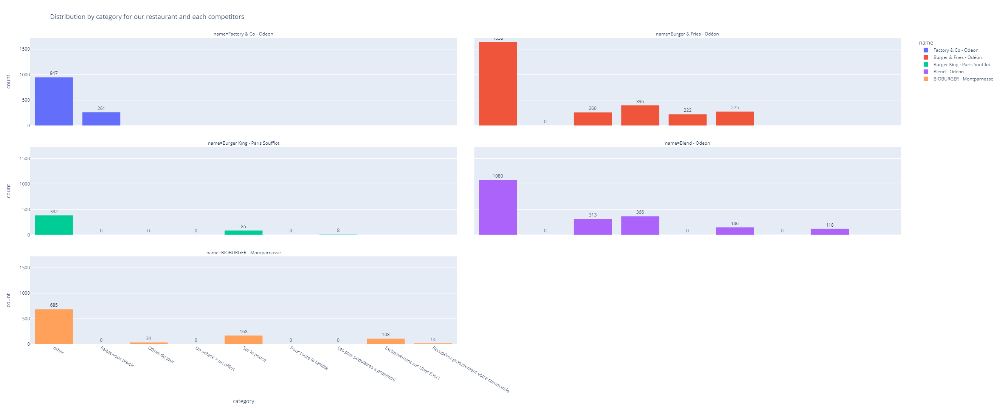

In [32]:
fig = px.histogram(uber_eat_filtered, x="category", facet_col="name", facet_col_wrap=2, color="name", title="Distribution by category for our restaurant and each competitors")

fig.update_layout(
    width=1920,
    height=1080
)

fig.update_traces(texttemplate='%{y}', textposition='outside')

fig.show()

Burger King being well placed appears in very few categories in the Uber Eats catalog. Yet, it is still very well placed in the rankings. There are other factors that influence the ranking of Burger King (such as rating, conversion rate, number of orders etc.). Our restaurant appears in quite a few categories and especially in the Other category. Blend Odeon in the category "Exclusively on Uber Eats" and that is not our case. 

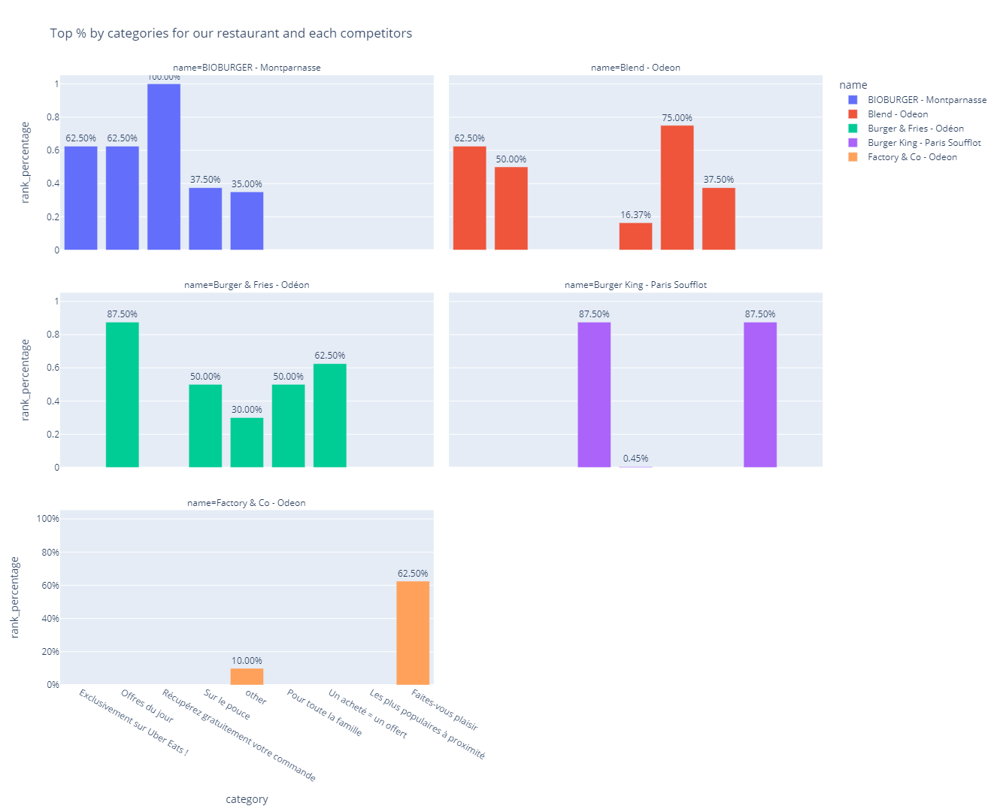

In [123]:
median_rank = uber_eat_filtered.groupby(['name', 'category'])['rank_percentage'].median().reset_index()
median_rank.rank_percentage = median_rank.rank_percentage / 100

fig = px.bar(median_rank, x="category", y="rank_percentage",facet_col="name", facet_col_wrap=2, color="name", title="Top % by categories for our restaurant and each competitors")

# Update layout
fig.update_layout(
    width=1920,
    height=1080,
    yaxis=dict(
        tickformat=',.0%',
    )
)

# Add value labels
fig.update_traces(texttemplate='%{y:.2%}', textposition='outside')

fig.show()

The big difference between our competitors are :
- Burger King is top 1% in the Other category which is saturated with restaurants. The customer can therefore quickly see the restaurant appear on the home page.
- Blend is also highly ranked in Other and 1 Buy 1 Free. It also appears in the exclusives of the platform
- Factory And Co is well placed only in Other like Burger King

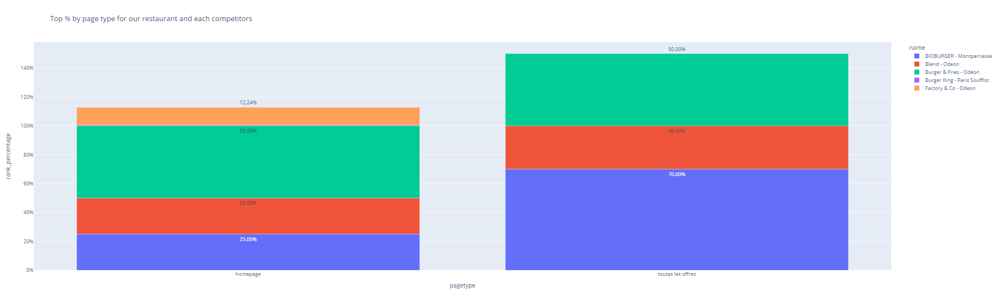

In [83]:
median_rank = uber_eat_filtered.groupby(['name', 'pagetype'])['rank_percentage'].median().reset_index()
median_rank.rank_percentage = median_rank.rank_percentage / 100

fig = px.bar(median_rank, x="pagetype", y="rank_percentage", color="name", title="Top % by page type for our restaurant and each competitors")

# Update layout
fig.update_layout(
    width=1280,
    height=720,
    yaxis=dict(
        tickformat=',.0%',
    )
)

# Add value labels
fig.update_traces(texttemplate='%{y:.2%}', textposition='outside')

fig.show()

Smaller restaurants try to make offers to move up in the rankings while larger restaurant chains don't need to make promotional offers to be well referenced.

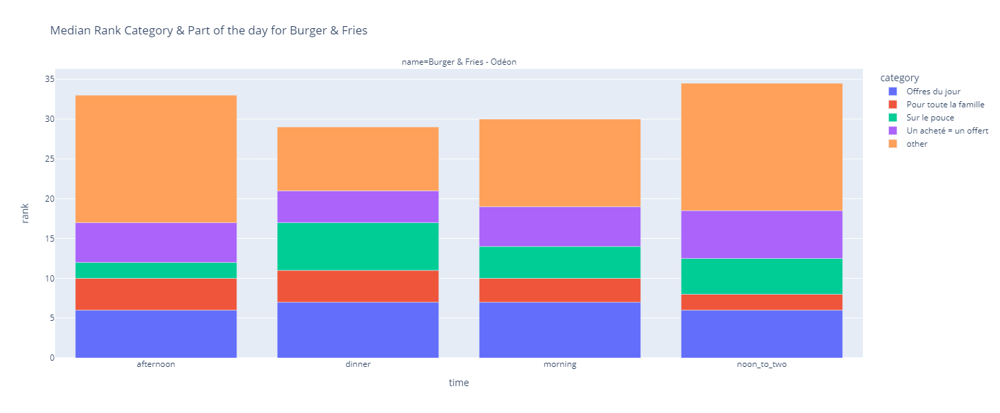

In [124]:
median_rank = uber_eat_filtered[uber_eat_filtered.name == "Burger & Fries - Odéon"].groupby(['name', 'category', 'time'])['rank'].median().reset_index()

fig = px.bar(median_rank, x='time', y='rank', color='category', facet_col='name', title='Median Rank Category & Part of the day for Burger & Fries')

# Update layout
fig.update_layout(
    width=800,
    height=600
)


# Show figure
fig.show()


We need to improve our offer between noon and two as well as in the afternoon. We have better SEO at dinner time for example. For the morning, the rank data is not meaningful because the scrapping stops in the evening around 10:30 p.m. and the restaurant opens around 11 a.m. So we don't have enough hindsight to know if our restaurant is performing at night. However, the restaurant can offer more aggressive prices at lunchtime.